# ADVANCED LANE FINDING
`
Process
1. Camera Calibration
2. Undistort Image
3. Perspective Transform
4. Image Thresholding
5. Lane Finding (Find Lane Pixels, Lane Finding, Window Finding, Prior Search)
6. Calculate Measurements (Radius of Curvarture, Offset)
7. Unwrap The Image
8. Display Metrics on the Image
9. Pipeline

In [123]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
from collections import deque
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

In [124]:
def camera_calibration(cpath, show = True):
    
    #prepare object points like (0,0,0),(1,0,0),(2,0,0)... for 9*6 chessboard size
    
    nx = 9
    ny = 6
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)
    
    image_name = glob.glob(cpath)  # Image List
    
    obj_points = []
    img_points = []
    
    # Step through the list and search for chessboard corners
    for id,img in enumerate(image_name):
            
            test_img = cv2.imread(img)
            gray = cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)
            
            # find the corners of the chessboard sized 9*6
            ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
            
            if ret:
                obj_points.append(objp)
                img_points.append(corners)
            
                img_size = (test_img.shape[1], test_img.shape[0])
            
                # draw the chessboard and display the corners
                cv2.drawChessboardCorners(test_img, (nx,ny), corners, ret)
                if show:
                    f,(ax1,ax2) = plt.subplots(1,2, figsize=(10,5))
                    ax1.imshow(mpimg.imread(img))
                    ax1.set_title("Without Corners")
                    ax2.imshow((test_img))
                    ax2.set_title("with Corners")
    # calibrate 
    #ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, img_size, None, None)
            
    return obj_points,img_points
    

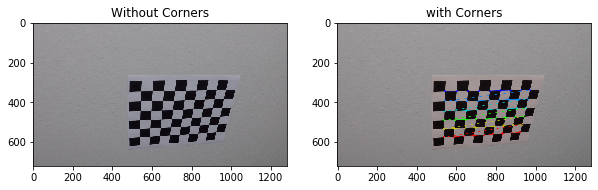

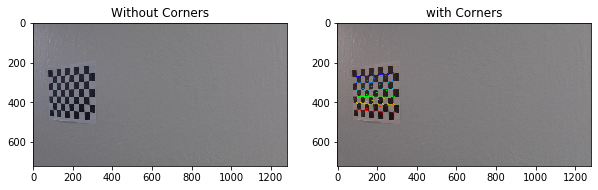

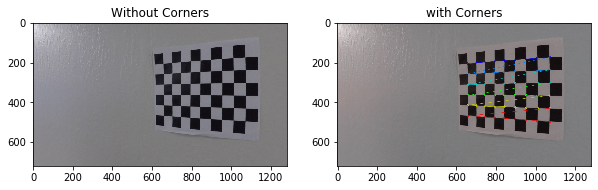

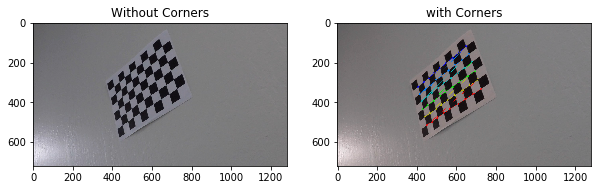

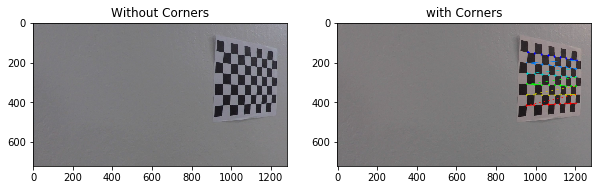

...

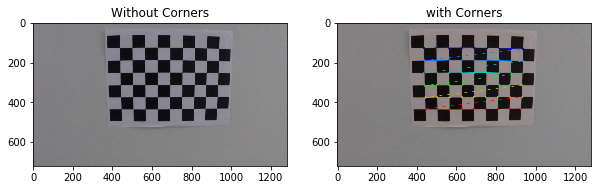

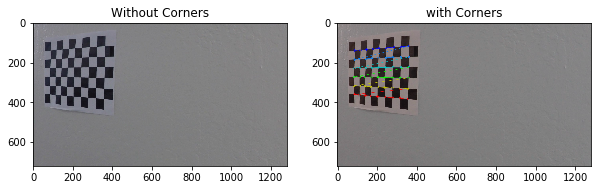

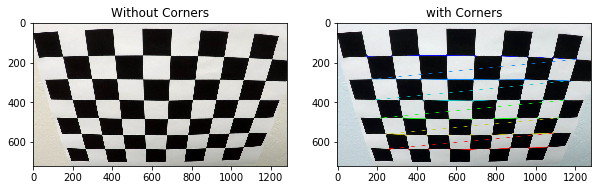

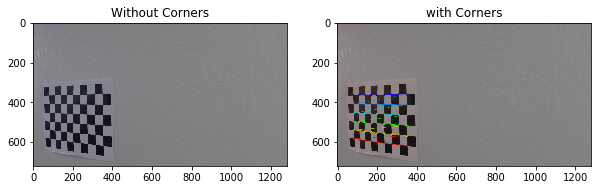

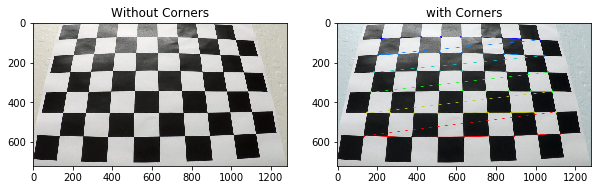

In [125]:
# corner display of each chessboard image
points_obj,points_img = camera_calibration('./camera_cal/calibration*.jpg')


In [126]:
def undistort_image(image,show = True, read = True):
    
    if read:
        image = cv2.imread(image)
        
    img_size = (image.shape[1], image.shape[0])
    
    # calibrate the image
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(points_obj, points_img, img_size, None, None)  
    
    # undistort the image
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    
    if show:
        f, (ax1, ax2) = plt.subplots(1,2, figsize = (10,5))
        ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        ax1.set_title("Distorted Image")
        ax2.imshow(cv2.cvtColor(undist,cv2.COLOR_BGR2RGB))
        ax2.set_title("Undistorted_Image")
        
    return undist


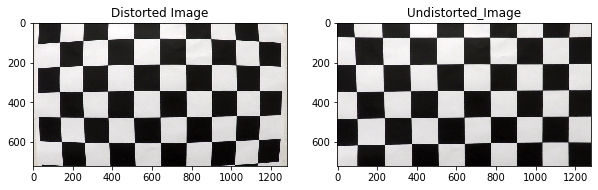

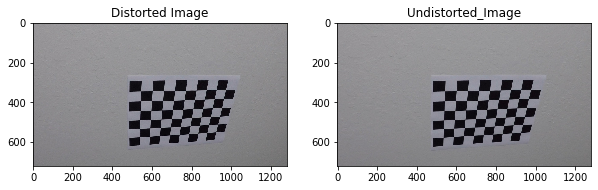

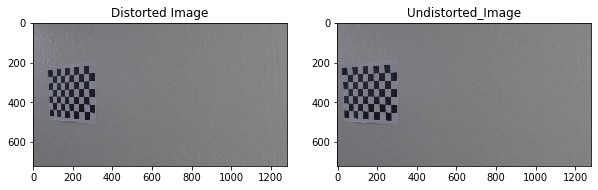

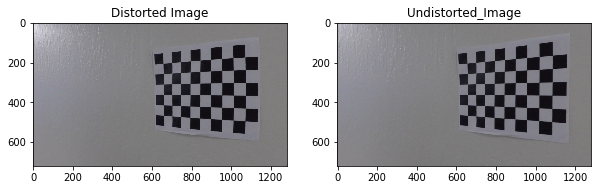

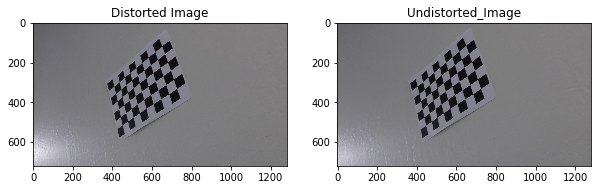

...

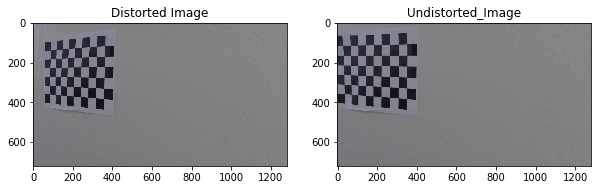

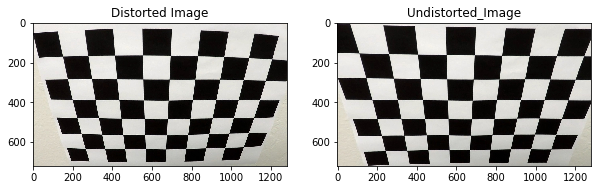

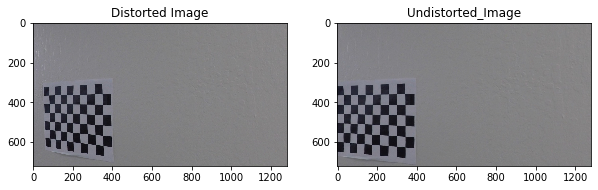

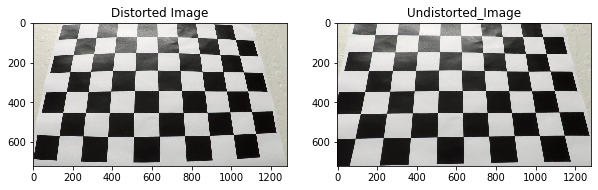

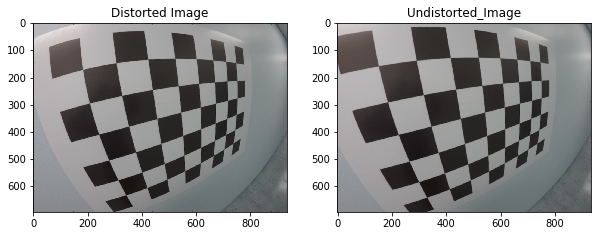

In [127]:
#Undistorting the chessboard images
cal_images = glob.glob('./camera_cal/calibration*.jpg')
for cal_image in cal_images:
    undistort_image(cal_image)

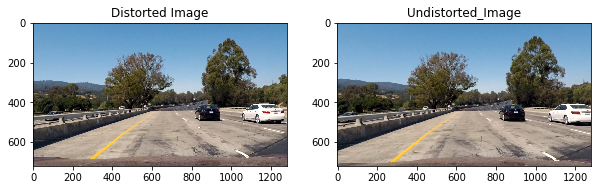

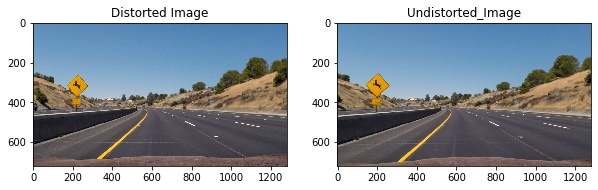

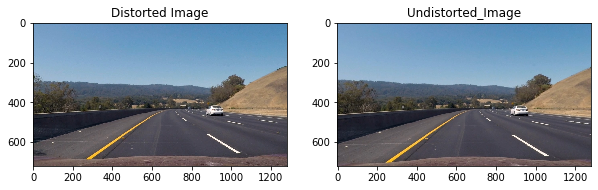

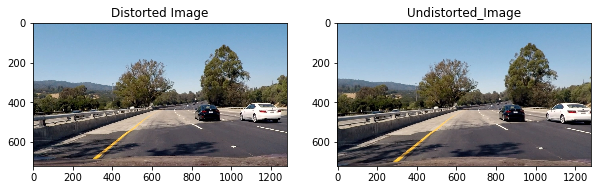

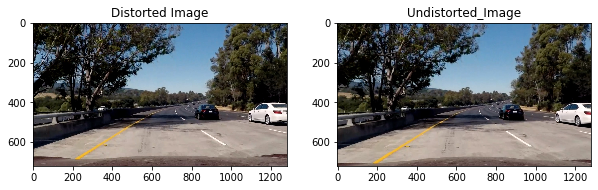

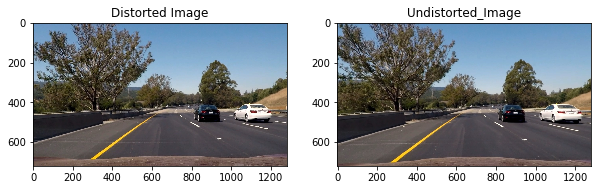

In [128]:
# Undistort the test images
test_images = glob.glob('./test_image/test*.jpg')
for test_image in test_images:
    undistort_image(test_image)

In [129]:
def perspective(image,show=True,read=True):
    
        
    img_size = (image.shape[1],image.shape[0])
    
    # specify the src and dist coordinates
    
    src = np.float32([[280,  700],  
             [595,  460], 
             [725,  460],  
             [1125, 700]])
    dst = np.float32([[250,  720],  
             [250,    0], 
             [1065,   0],  
             [1065, 720]])
    
    # Perspective Transform
    M = cv2.getPerspectiveTransform(src,dst)
    # Inverse Perspective Transform
    Minv = cv2.getPerspectiveTransform(dst,src)
    
    warped = cv2.warpPerspective(image, M, img_size , flags = cv2.INTER_LINEAR) 
    
    if show:
        f, (ax1, ax2) = plt.subplots(1,2, figsize = (10,5))
        ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        ax1.set_title("Undistorted Image")
        ax2.imshow(cv2.cvtColor(warped,cv2.COLOR_BGR2RGB))
        ax2.set_title("Warped Image")

    
    return warped,M,Minv

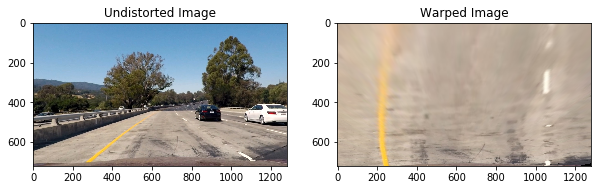

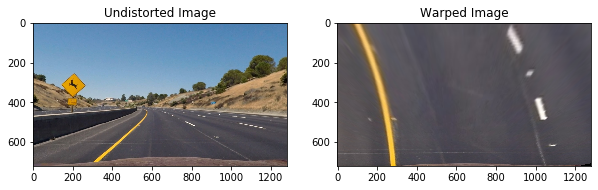

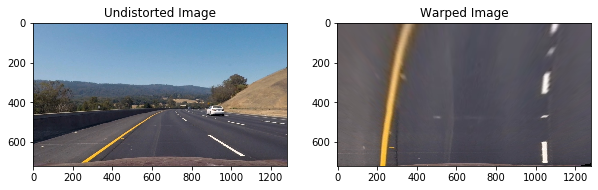

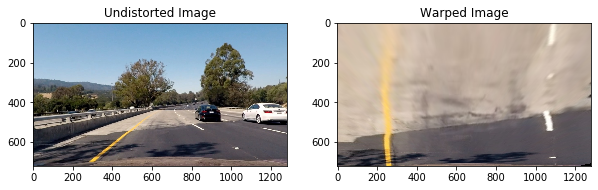

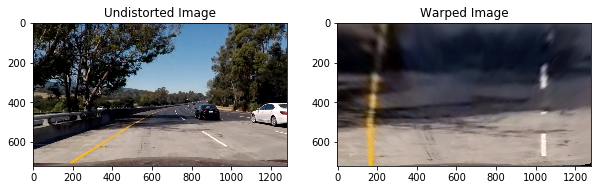

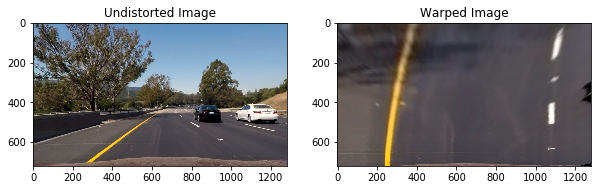

In [130]:
# Testing the perspective transfrom function on test images
def perspective_transform():    
    test_imgs = glob.glob('./test_image/test*.jpg')

    for test_image in test_imgs:
        undist_img = undistort_image(test_image,show = False)
        perspective(undist_img)

perspective_transform()

In [154]:
#thresholding the images 
def gaussian_blur(img,kernel = 5,show = True, read = True):
    if read:
        img = undistort_image(img,show=False)
    else:
        img = undistort_image(img,show=False,read = False)

    blur = cv2.GaussianBlur(img,(kernel,kernel),0)
    return blur

#absolute threshold
def abs_threshold(img, orient = "x", thresh=(0,255), kernel_size = 3):
    
    if orient == "x":
        sobel = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize = kernel_size)
    else:
        sobel = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize = kernel_size)
    
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255 * abs_sobel/ np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 255
    
    return binary_output

def mag_threshold(img, thresh=(0,255), kernel_size = 3):
    
    sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize = kernel_size)
    sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize = kernel_size)
    
    sobel_dir = np.sqrt(sobel_x**2 + sobel_y**2)
    
    scaled_factor = np.max(sobel_dir)/255
    scaled_sobel = (sobel_dir/scaled_factor).astype(np.uint8)
    
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 255
    
    return binary_output

    
def dir_threshold(img, kernel_size=3, thresh=(0, np.pi/2)):
    
    sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=kernel_size)
    sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=kernel_size)
    abs_grad = np.arctan2(np.abs(sobel_y), np.abs(sobel_x))

    dir_output = np.zeros_like(abs_grad)
    dir_output[(abs_grad >= thresh[0]) & (abs_grad <= thresh[1])] = 255
    return dir_output


def combined_gradient(img, ismask):
    
    # Combination of different thresholds 
    
    width, height = (img.shape[1],img.shape[0])
    
    r = img[:,:,2] # Using the R channel of the image
    
    x_sobel = abs_threshold(r, 'x', thresh =(35,100)) # sobel threshold in x direction
    y_sobel = abs_threshold(r, 'y', thresh = (30,255)) # # sobel threshold in y direction
    mag_sobel = mag_threshold(r, kernel_size = 3,thresh = (30,255)) 
    dir_sobel = dir_threshold(r, kernel_size = 15,thresh = (0.7,1.3))
    
    combined_gradient = np.zeros_like(dir_sobel)
    combined_gradient[((x_sobel > 1) & (mag_sobel > 1) & (dir_sobel > 1)) | ((x_sobel > 1) & (y_sobel > 1))] == 255
    
    # masking the image where lanes can be found
    if ismask:
        mask = np.zeros_like(combined_gradient)
        region_of_interest_vertices = np.array([[0,height-1], [width/2, int(0.5*height)], [width-1, height-1]], dtype=np.int32)
        cv2.fillPoly(mask, [region_of_interest_vertices], 255)
        thresholded = cv2.bitwise_and(combined_gradient, mask)
        return thresholded
    else:
        return combined_gradient

def channel_thresh(channel, thresh=(80, 255)):
    
    # thresholding using different color channels
    
    binary = np.zeros_like(channel)
    binary[(channel > thresh[0]) & (channel <= thresh[1])] = 255
    return binary



def hls_thresh(img, ismask):
    
    # thresholding using HLS Color space
    
    height,width = (img.shape[0],img.shape[1])
    
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS) # Transforming from BGR to HLS Color Space
    
    h = hls[:,:,0] # H Channel
    l = hls[:,:,1] # L Channel
    s = hls[:,:,2] # S Channel
    
    h_channel = channel_thresh(h, (10,100))
    l_channel = channel_thresh(l, (10,60))
    s_channel = channel_thresh(s, (85,255))
    
    combined_hls = np.zeros_like(h_channel)
    combined_hls[((s_channel > 1) & (l_channel == 0)) | ((s_channel == 0) & (h_channel > 1) & (l_channel > 1))] = 255
    
    if ismask:
        mask = np.zeros_like(combined_hls)
        region_of_interest_vertices = np.array([[0,height-1], [width/2, int(0.5*height)], [width-1, height-1]], dtype=np.int32)
        cv2.fillPoly(mask, [region_of_interest_vertices], 255)
        thresholded = cv2.bitwise_and(combined_hls, mask)

        return thresholded
    else:
        return combined_hls

def combination(img,grad_thresh, hls_thresh,show = True):
    
    # Combination of gradient and hls threshold
    output = np.zeros_like(grad_thresh).astype(np.uint8)
    output[(grad_thresh > 1)] = 140
    output[(hls_thresh > 1)] = 255
    
    if show:
        f, (ax1, ax2) = plt.subplots(1,2, figsize = (10,5))
        ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax1.set_title("Undistorted Image")
        ax2.imshow((output))
        ax2.set_title("Warped Image")

        

    return output


In [99]:
class Lane:
    
    def __init__(self):
        #detect the lines in last iteration
        self.detect = False
        
        #x values fitted in last iterations
        self.prev_pointx = []
        #y values fitted in last iterations
        self.prev_pointy = []
        
        #coefficients for current fit
        self.current_fit = [np.array([False])]
        
        #radius of curvature
        self.radius_curvature = None
        
        #starting x val 
        self.x_start = None
        #ending x val
        self.x_end = None
        
        #y values for detected lines
        self.ally = None
        #x values for detected lines
        self.allx = None

def smoothing(lines, prev_n_lines=3):
    
    lines = np.squeeze(lines)       # remove single dimensional entries 
    avg_line = np.zeros((720))

    for i, line in enumerate(reversed(lines)):
        if i == prev_n_lines:
            break
        avg_line += line
    avg_line = avg_line / prev_n_lines

    return avg_line



In [100]:
def curvature_radius(left_lane, right_lane):
    
    ploty = left_lane.ally
    leftx = left_lane.allx
    rightx = right_lane.allx
    
    leftx = leftx[::-1]
    rightx = rightx[::-1]

    xm_per_pix = 30/720
    ym_per_pix = 3.7*(720/1280)/abs(right_lane.x_start - left_lane.x_start)
    
    # fit the second order polynomial in each fake line
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    
    y_eval = np.max(ploty)
    
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    left_lane.radius_curvature = left_curverad
    right_lane.radius_curvature = right_curverad
    

In [101]:
def find_lane_pixels(img):
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result

    out_img = np.dstack((img,img,img))*255

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # number of sliding windows
    nwindows = 9
    
    # set the width of the windows
    margin = 100
    
    # set minimum number of pixels found to recenter the window
    minpix = 50
    
    #set the height of the windows
    win_height = np.int(img.shape[0]//nwindows)
    
    #Position of all x and y nonzero pixels
    nonzero = img.nonzero()
    nonzero_x = np.array(nonzero[1])
    nonzero_y = np.array(nonzero[0])
    
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    #step through windows
    for window in range(nwindows):
        win_y_low = img.shape[0] - (window+1)*win_height
        win_y_high = img.shape[0] - (window)*win_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        #show rectangle on the image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 3)
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 3)
            
        # identifying the pixels within the window
        good_left_inds = ((nonzero_y >= win_y_low) & (nonzero_y < win_y_high)
                            &(nonzero_x >= win_xleft_low) & (nonzero_x < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzero_y >= win_y_low) & (nonzero_y < win_y_high)
                            &(nonzero_x >= win_xright_low) & (nonzero_x < win_xright_high)).nonzero()[0]
        
        
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # recenter the next window on the mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzero_x[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzero_x[good_right_inds]))
            
        #concatenate the arrays
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        pass
        
    # Extract left and right line pixel positions
    leftx = nonzero_x[left_lane_inds]
    lefty = nonzero_y[left_lane_inds]
    rightx = nonzero_x[right_lane_inds]
    righty = nonzero_y[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


In [102]:
def fit_poly(img,left_lane, right_lane, show = True):
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(img)
    
    #Fit the second order polynomial
    left_fit_poly = np.polyfit(lefty, leftx, 2)
    right_fit_poly = np.polyfit(righty, rightx, 2)
    
    #store the current fit in the lane class
    left_lane.current_fit = left_fit_poly
    right_lane.current_fit = right_fit_poly
    
    #create x any y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0])
    
    try:
        left_fitx = left_fit_poly[0]*ploty**2 + left_fit_poly[1]*ploty + left_fit_poly[2]
        right_fitx = right_fit_poly[0]*ploty**2 + right_fit_poly[1]*ploty + right_fit_poly[2]
    except TypeError:
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
        
        
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    
    
    
    leftx_avg = np.average(left_fitx)
    rightx_avg = np.average(right_fitx)
    
    left_lane.prev_pointx.append(leftx_avg)
    right_lane.prev_pointx.append(rightx_avg)
    
    if len(left_lane.prev_pointx) > 10:
        left_smooth_line = smoothing(left_lane.prev_pointx, 10)
        left_avg_fit = np.polyfit(ploty, left_smooth_line, 2 )
        leftx_fit_plot = left_avg_fit[0]*ploty**2 + left_avg_fit[1]*ploty + left_avg_fit[2]
        left_lane.current_fit = leftx_fit_plot
        
        left_lane.allx,left_lane.ally = leftx_fit_plot, ploty
    
    else:
        left_lane.current_fit = left_fit_poly
        left_lane.allx, left_lane.ally = left_fitx, ploty
        
    if len(right_lane.prev_pointx) > 10:
        right_smooth_line = smoothing(right_lane.prev_pointx, 10)
        right_avg_fit = np.polyfit(ploty, right_smooth_line, 2 )
        rightx_fit_plot = right_avg_fit[0]*ploty**2 + right_avg_fit[1]*ploty + right_avg_fit[2]
        right_lane.current_fit = rightx_fit_plot
        
        right_lane.allx,right_lane.ally = rightx_fit_plot, ploty
    
    else:
        right_lane.current_fit = right_fit_poly
        right_lane.allx, right_lane.ally = right_fitx, ploty
        

    
    lane_stddev = np.std(right_lane.allx - left_lane.allx)
    
    if lane_stddev>80:
        left_lane.detected = False
    
    left_lane.x_start, left_lane.x_end = left_lane.allx[len(left_lane.allx)-1],left_lane.allx[0]
    right_lane.x_start, right_lane.x_end = right_lane.allx[len(right_lane.allx)-1],right_lane.allx[0]
    
    curvature_radius(left_lane,right_lane)
    
    return out_img

In [103]:
def lane_search(img, left_lane, right_lane):
    
    out_img = np.dstack((img,img,img))*255
    
    nonzero = img.nonzero()
    nonzeroy = nonzero[0]
    nonzerox = nonzero[1]
    
    margin = 100
    
    left_line_fit = left_lane.current_fit
    right_line_fit = right_lane.current_fit
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    
    leftx, lefty = nonzerox[left_lane_inds], nonzeroy[left_lane_inds]
    rightx, righty = nonzerox[right_lane_inds], nonzeroy[right_lane_inds]
    
    
    left_fit_poly = np.polyfit(lefty, leftx, 2)
    right_fit_poly = np.polyfit(righty, rightx, 2)
    
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0])
    
    try:
        left_fitx = left_fit_poly[0]*ploty**2 + left_fit_poly[1]*ploty + left_fit_poly[2]
        right_fitx = right_fit_poly[0]*ploty**2 + right_fit_poly[1]*ploty + right_fit_poly[2]
    except TypeError:
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
        
        
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    
    leftx_avg = np.average(left_fitx)
    rightx_avg = np.average(right_fitx)
    
    left_lane.prev_pointx.append(leftx_avg)
    right_lane.prev_pointx.append(rightx_avg)
    
    if len(left_lane.prev_pointx) > 10:
        left_smooth_line = smoothing(left_lane.prev_pointx, 10)
        left_avg_fit = np.polyfit(ploty, left_smooth_line, 2 )
        leftx_fit_plot = left_avg_fit[0]*ploty**2 + left_avg_fit[1]*ploty + left_avg_fit[2]
        left_lane.current_fit = leftx_fit_plot
        
        left_lane.allx,left_lane.ally = leftx_fit_plot, ploty
    
    else:
        left_lane.current_fit = left_fit_poly
        left_lane.allx, left_lane.ally = left_fitx, ploty
        
    if len(right_lane.prev_pointx) > 10:
        right_smooth_line = smoothing(right_lane.prev_pointx, 10)
        right_avg_fit = np.polyfit(ploty, right_smooth_line, 2 )
        rightx_fit_plot = right_avg_fit[0]*ploty**2 + right_avg_fit[1]*ploty + right_avg_fit[2]
        right_lane.current_fit = rightx_fit_plot
        
        right_lane.allx,right_lane.ally = rightx_fit_plot, ploty
    
    else:
        right_lane.current_fit = right_fit_poly
        right_lane.allx, right_lane.ally = right_fitx, ploty
        

    
    lane_stddev = np.std(right_lane.allx - left_lane.allx)
    
    if lane_stddev>80:
        left_lane.detected = False
    
    left_lane.x_start, left_lane.x_end = left_lane.allx[len(left_lane.allx)-1],left_lane.allx[0]
    right_lane.x_start, right_lane.x_end = right_lane.allx[len(right_lane.allx)-1],right_lane.allx[0]
    
    curvature_radius(left_lane,right_lane)
    
    return out_img
    

In [104]:
def driving_lane(img, left_lane, right_lane):
    
    win_img = np.zeros_like(img)
    
    ploty = left_lane.ally
    leftx = left_lane.allx
    rightx = right_lane.allx
    
    margin = 50
    
    # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([leftx - margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([leftx + margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([rightx - margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([rightx + margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
     # Draw the lane onto the warped blank image
    cv2.fillPoly(win_img, np.int_([left_line_pts]), (255,0, 255))
    cv2.fillPoly(win_img, np.int_([right_line_pts]), (255,0, 255))
    
    pts_left = np.array([np.transpose(np.vstack([leftx+margin/5, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([rightx-margin/5, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(win_img, np.int_([pts]), (0,255,0))
    
    result = cv2.addWeighted(img, 1, win_img, 0.3, 0)

    return result,win_img

In [105]:
def get_lane_lines_img(binary_img, left_lane, right_lane):
    
    if left_lane.detect == False:
        return fit_poly(binary_img, left_lane, right_lane)
    else:
        return lane_search(binary_img, left_lane, right_lane)
    
def draw_lane(img,warp_img,left_lane,right_lane,Minv):
    
    warp_zero = np.zeros_like(warp_img).astype(np.uint8)
    color_img = np.dstack((warp_zero,warp_zero,warp_zero))
    
    left_fitx,right_fitx=left_lane.allx,right_lane.allx
    ploty = left_lane.ally
    
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    cv2.fillPoly(color_img, np.int_([pts]), (0,255, 0))
    
    newwarp = cv2.warpPerspective(color_img, Minv, (img.shape[1], img.shape[0])) 
    
    return cv2.addWeighted(img, 1, newwarp, 0.3, 0)

In [106]:
def car_offset(img,left_lane,right_lane):
    
    img_size = img.shape
    
    mid_x_pos = img_size[1]//2
    
    car_pos = (left_lane.allx[-1]-right_lane.allx[-1] )/2
    
    offsetx = (mid_x_pos-car_pos)*(3.7/800)
    
    return offsetx


def get_metrics(img,left_lane,right_lane):
    
    left_curvature = left_lane.radius_curvature
    right_curvature = right_lane.radius_curvature
    
    offsetx = car_offset(img,left_lane,right_lane)
    
    out_img = img.copy()
    
    cv2.putText(out_img, 'Left lane line curvature: {:.2f} m'.format(left_curvature), 
                (60, 60), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 5)
    cv2.putText(out_img, 'Right lane line curvature: {:.2f} m'.format(right_curvature), 
                (60, 110), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 5)
    cv2.putText(out_img, 'Horizontal car offset: {:.2f} m'.format(offsetx), 
                (60, 160), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 5)
    
    return out_img
    

In [155]:
class Pipeline:
    
    def __init__(self,calpath):
        
        self.obj_pts,self.img_pts = camera_calibration(calpath,show = False)
        
    
    def __call__(self,img):
        
        left_lane = Lane()
        right_lane = Lane()
        
        undistorted = undistort_image(img,show=False,read = False)
        
        gradient_threshold = combined_gradient(undistorted, ismask = False)
        
        hls_threshold = hls_thresh(undistorted, ismask = False)
        combined_result = combination(undistorted,gradient_threshold, hls_threshold,show = False)

        warp,m,minv = perspective(combined_result, read = False,show = False)
        
        out_image = get_lane_lines_img(warp, left_lane, right_lane)
        
        lane_result,lane_img = driving_lane(out_image,left_lane,right_lane)
        
        unwrap = draw_lane(undistorted,warp,left_lane,right_lane,minv)
        
        metrics_img = get_metrics(unwrap,left_lane,right_lane)
        
        return metrics_img

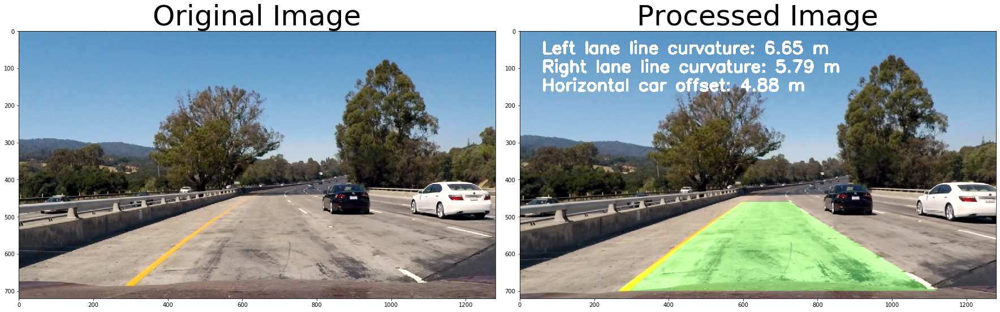

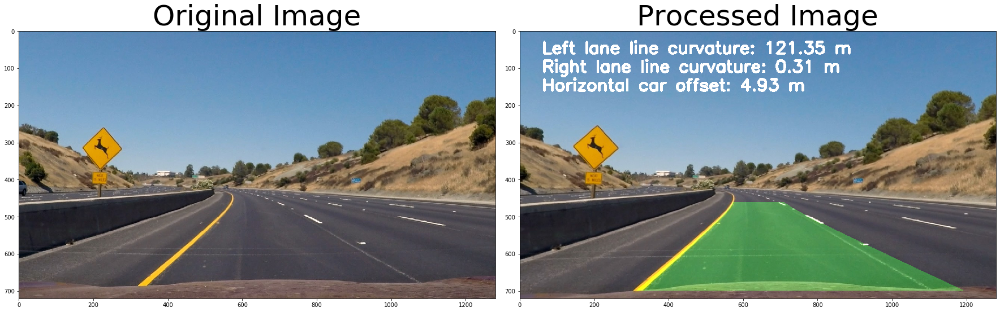

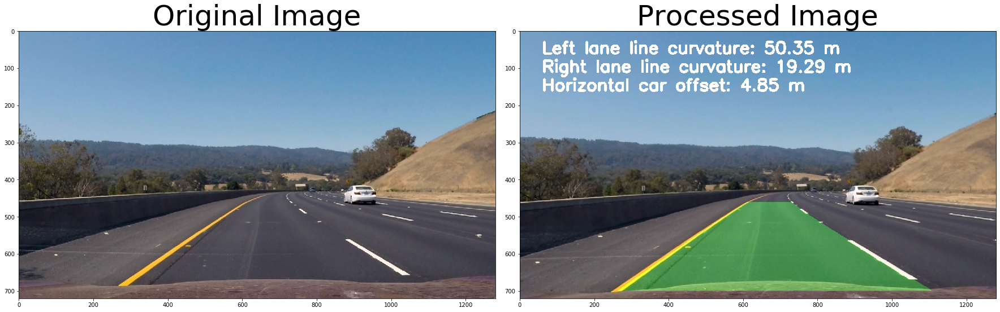

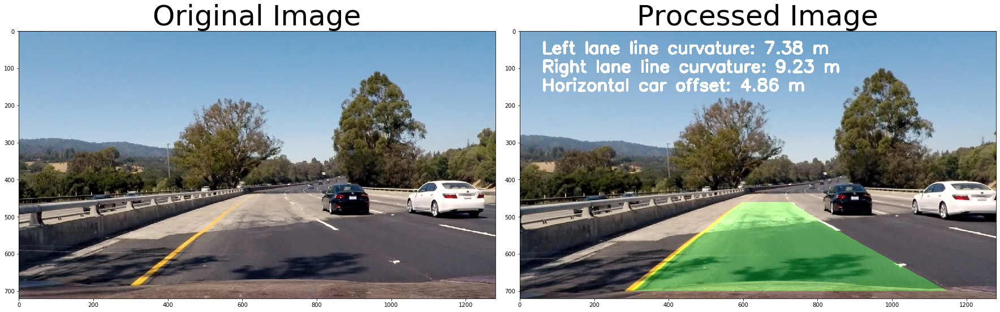

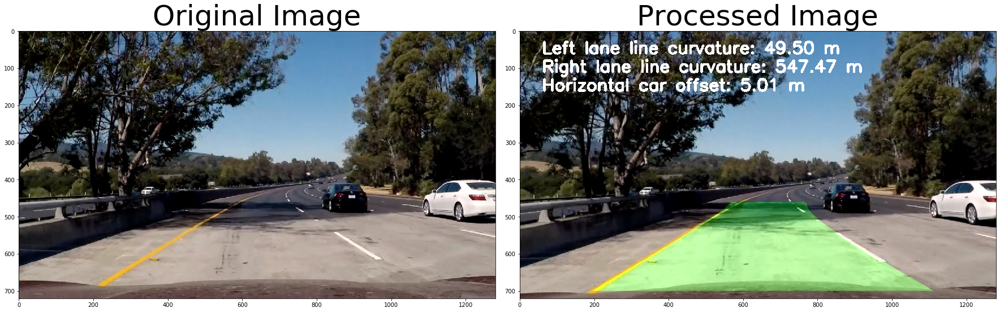

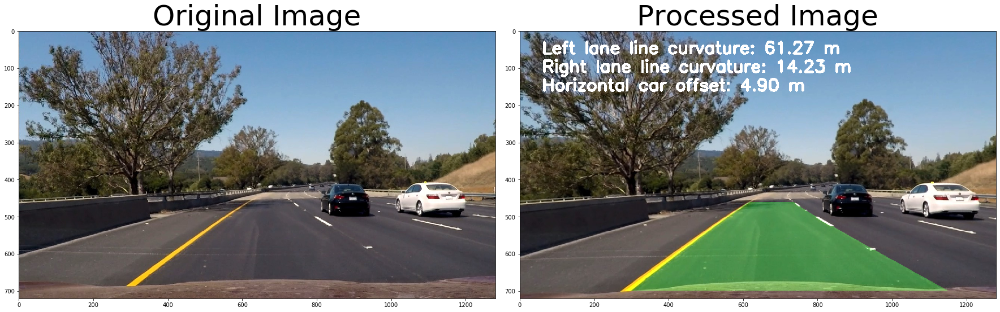

In [156]:
img = glob.glob('./test_image/test*.jpg')
# Process video frames with our 'process_image' function
process_image = Pipeline('./camera_cal/calibration*.jpg')

# Apply pipeline
for image in img: 
    
    img = mpimg.imread(image)
    processed = process_image(img)

    # Plot the 2 images
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(processed, cmap='gray')
    ax2.set_title('Processed Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


In [109]:
def apply_video(input_video, output_video):

    # Process video frames with our 'process_image' function
    process_image = Pipeline('./camera_cal/calibration*.jpg')
    
    ## You may uncomment the following line for a subclip of the first 5 seconds
    #clip1 = VideoFileClip(input_video).subclip(0,5)
    clip1 = VideoFileClip(input_video)
    white_clip = clip1.fl_image(process_image)
    %time white_clip.write_videofile(output_video, audio=False)
    
    print("Apply video pipeline: SUCCESS!")


In [110]:
input_video = './test_image/project_video.mp4'
output_video = './test_image/project_video_output.mp4'
apply_video(input_video,output_video)

                                                                                                                       
                                                                                                                    

t:  13%|████████▎                                                         | 159/1260 [09:07<09:53,  1.85it/s, now=None]

                                                                                                                       
                                                                                                                    

t:  13%|████████▎                                                         | 159/1260 [09:07<09:53,  1.85it/s, now=None]

t:  13%|████████▎                                                         | 159/1260 [04:07<09:43,  1.89it/s, now=None]


t:   0%|                                                                            | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video ./test_image/project_video_output.mp4.
Moviepy - Writing video ./test_image/project_video_output.mp4






t:   0%|                                                                    | 2/1260 [00:00<05:31,  3.79it/s, now=None]


t:   0%|▏                                                                   | 3/1260 [00:01<07:06,  2.95it/s, now=None]


t:   0%|▏                                                                   | 4/1260 [00:01<08:18,  2.52it/s, now=None]


t:   0%|▎                                                                   | 5/1260 [00:02<09:15,  2.26it/s, now=None]


t:   0%|▎                                                                   | 6/1260 [00:02<10:01,  2.08it/s, now=None]


t:   1%|▍                                                                   | 7/1260 [00:03<10:48,  1.93it/s, now=None]


t:   1%|▍                                                                   | 8/1260 [00:03<10:52,  1.92it/s, now=None]


t:   1%|▍                                                                   | 9/1260 [00:04<10:53,  1.91it/s, now=None]


t:   1%|▌            

Moviepy - Done !
Moviepy - video ready ./test_image/project_video_output.mp4
Wall time: 11min 6s
Apply video pipeline: SUCCESS!
